# Data range verification

The purpose of this notebook is to check the range in which the CT values fall (in HU) as it needs to drive decision making on the normalization procedure for the pipeline.

In [1]:
import os
from pathlib import Path

import matplotlib.pyplot as plt
import nibabel as nib
import numpy as np
import pandas as pd
from tqdm import tqdm

In [2]:
# Find project root (folder that contains .git)
ROOT = Path.cwd()
while not (ROOT / ".git").exists():
    ROOT = ROOT.parent

# Set working directory to root
os.chdir(ROOT)

print("Now working in:", Path.cwd())

Now working in: C:\Users\couch\Documents\robust-radiotherapy-planning


In [3]:
from src.data_utils import create_data_split_dict

In [4]:
# Load data dictionary
data_dict = create_data_split_dict(
    seed=42,
    train_fraction=0.8,
    folds=5,
    save=False,
)

In [5]:
# List to collect data rows
stats_list = []

for file in tqdm([*data_dict[0]["train"], *data_dict[0]["val"]]):
    img = nib.load(file)

    # Extract the image data as a NumPy array
    data = img.get_fdata()

    # Update min and max value
    stats_list.append(
        {
            "min_value": data.min(),
            "max_value": data.max(),
        }
    )

df_summary = pd.DataFrame(stats_list)
df_summary.describe()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1631/1631 [06:27<00:00,  4.21it/s]


,min_value,max_value
count,1631.000000,1631.000000
mean,-1042.871245,1491.828326
std,160.895380,73.819079
min,-5053.000000,759.000000
25%,-1024.000000,1500.000000
50%,-1024.000000,1500.000000
75%,-1024.000000,1500.000000
max,-1024.000000,1500.000000


Data generally stays in the range -1000:1500 which means that -1000 should be 0 and 1500 should be 1 after min-max normalization. -1000 is air and values which are lower are not particularly meaningful, so it's fair to clip there despite it going below that on occasion. It's odd to see a minimal value below 1024 and a maximum value below 1000, so that should be looked into.

Data Range: -1404.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_02\Patient_02_fraction_1_.nii.gz


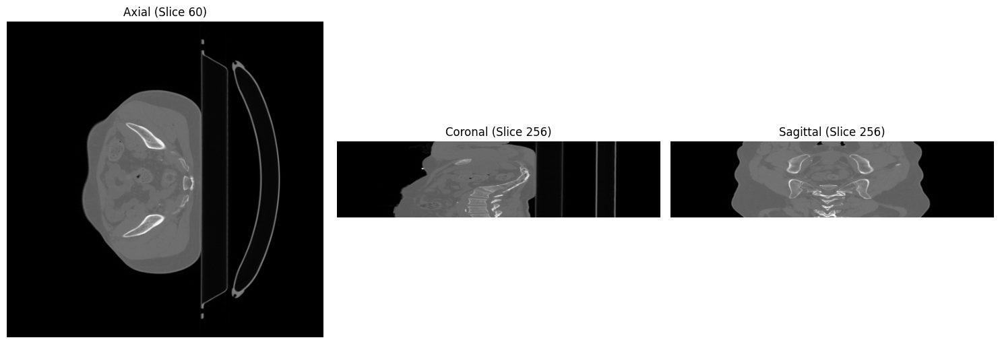

Data Range: -1811.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_03\Patient_03_fraction_1_.nii.gz


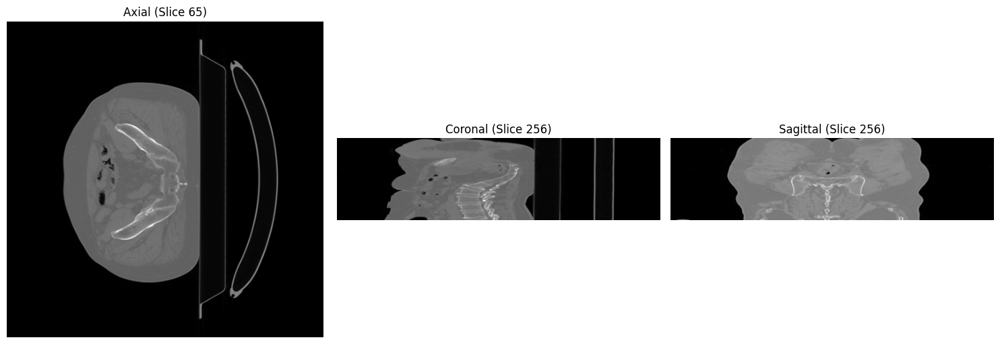

Data Range: -1355.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_04\Patient_04_fraction_1_.nii.gz


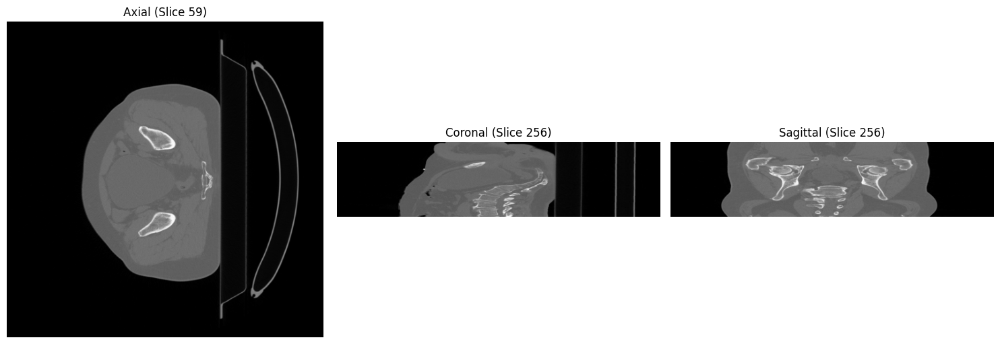

Data Range: -1326.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_05\Patient_05_fraction_1_.nii.gz


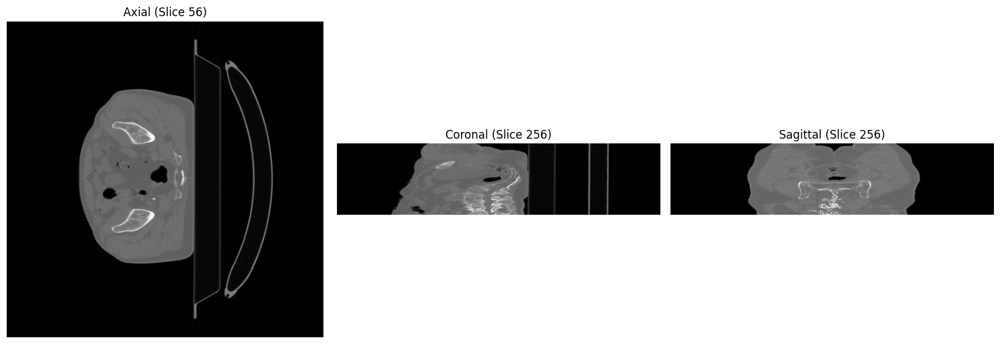

Data Range: -1307.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_06\Patient_06_fraction_1_.nii.gz


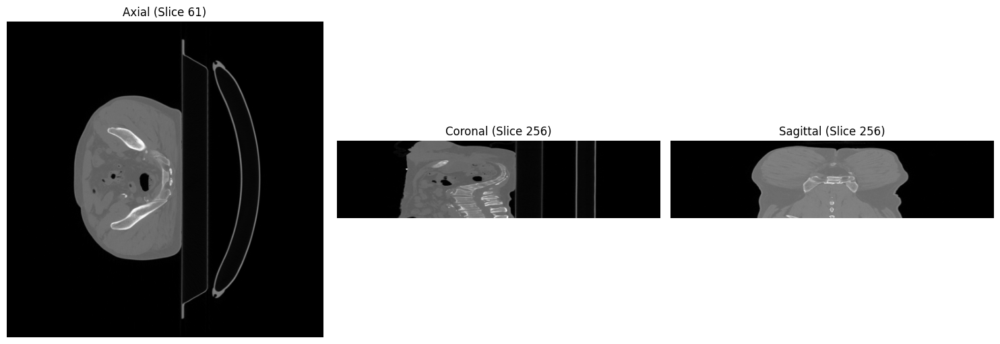

Data Range: -1595.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_08\Patient_08_fraction_1_.nii.gz


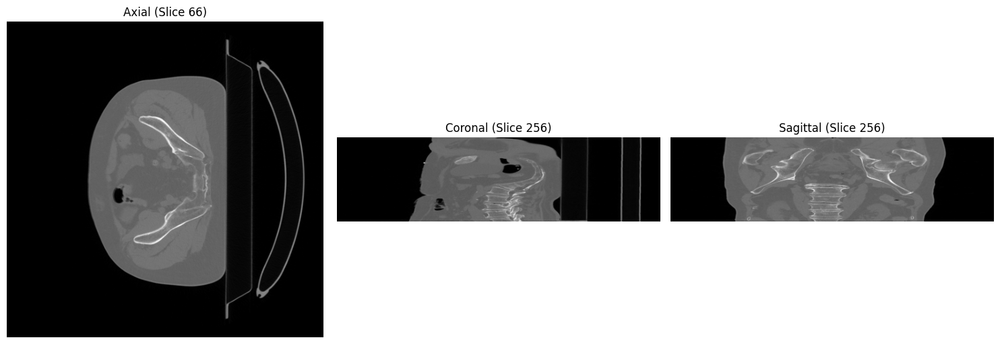

Data Range: -1290.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_09\Patient_09_fraction_1_.nii.gz


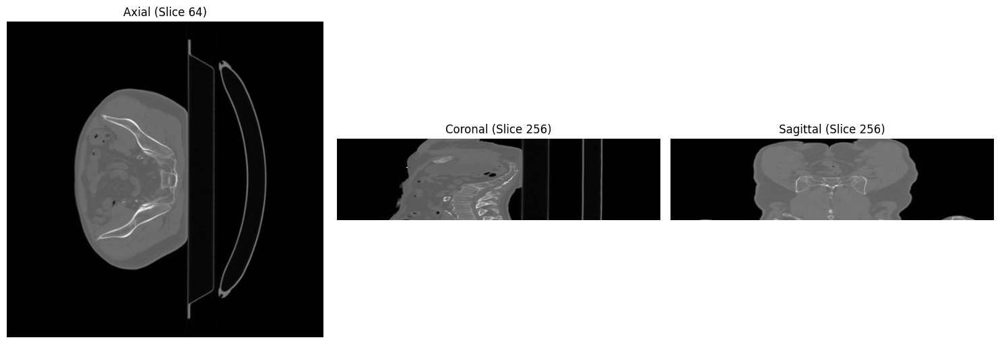

Data Range: -1338.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_12\Patient_12_fraction_1_.nii.gz


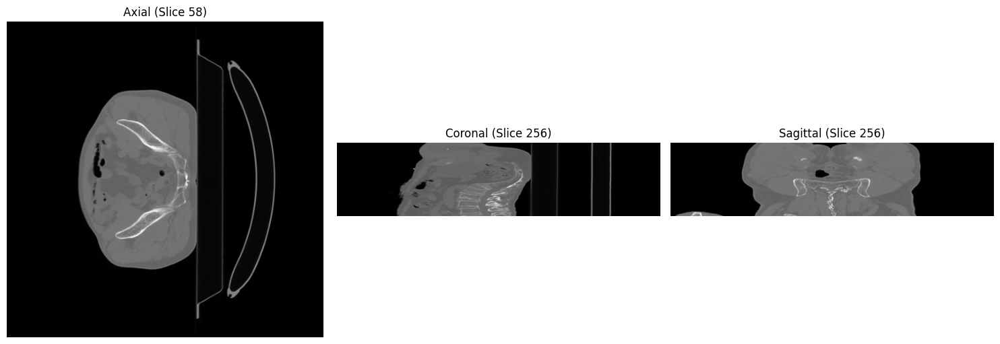

Data Range: -2079.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_13\Patient_13_fraction_1_.nii.gz


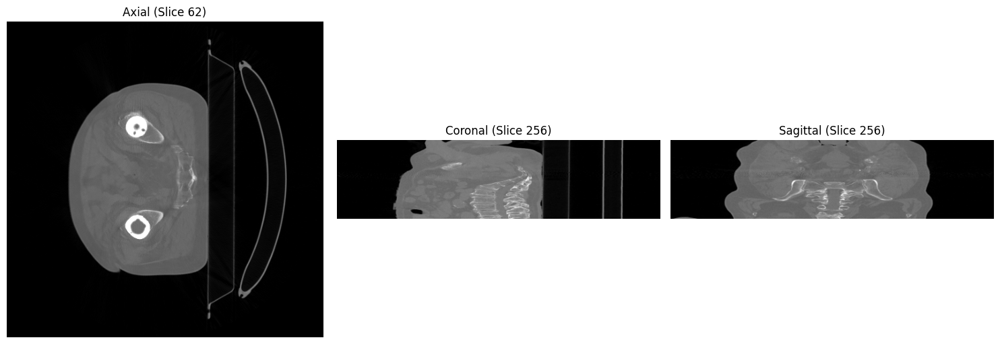

Data Range: -1403.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_14\Patient_14_fraction_1_.nii.gz


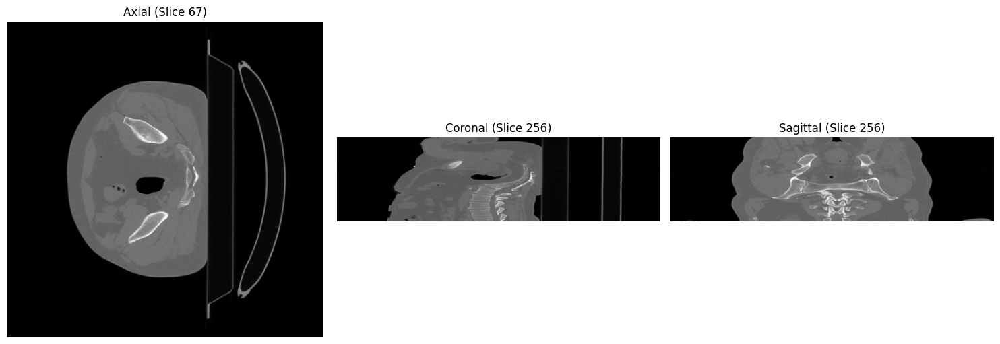

Data Range: -1324.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_18\Patient_18_fraction_1_.nii.gz


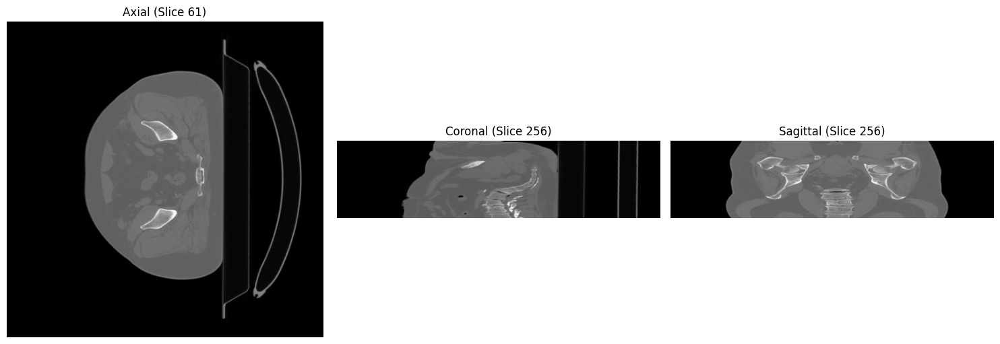

Data Range: -1024.00:854.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_20\Patient_20_fraction_14_.nii.gz


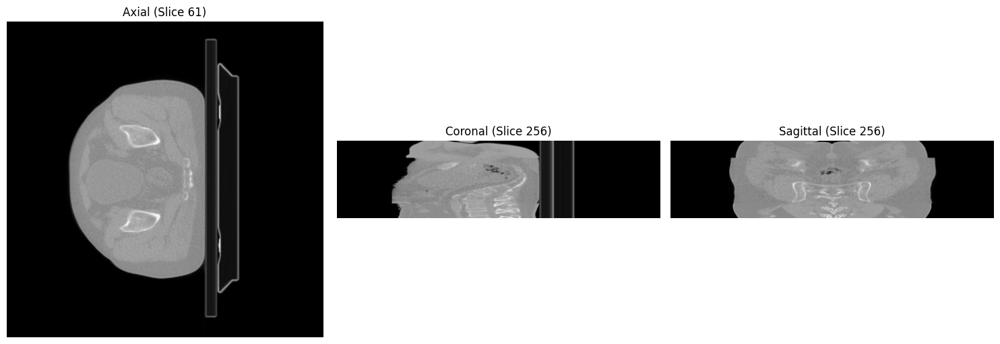

Data Range: -1322.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_20\Patient_20_fraction_1_.nii.gz


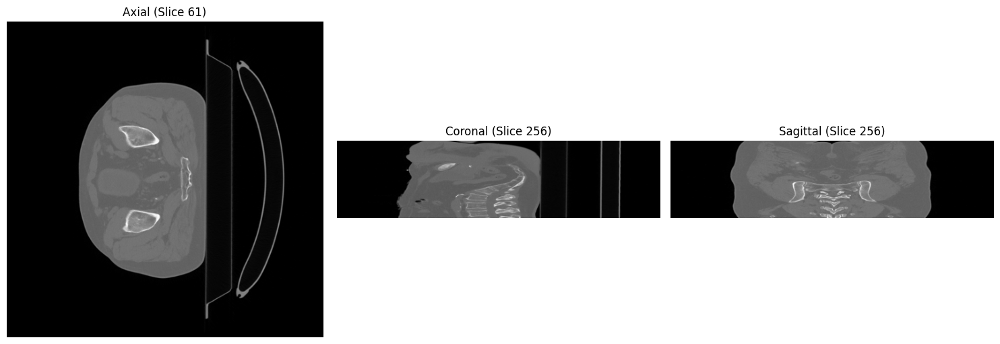

Data Range: -1309.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_21\Patient_21_fraction_1_.nii.gz


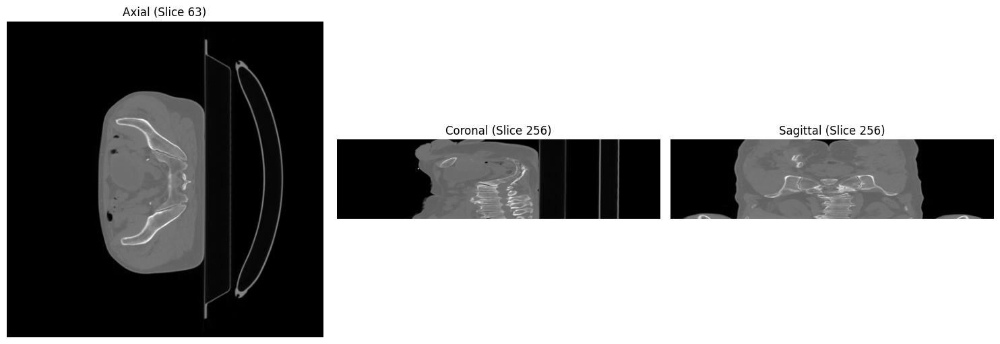

Data Range: -1725.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_22\Patient_22_fraction_1_.nii.gz


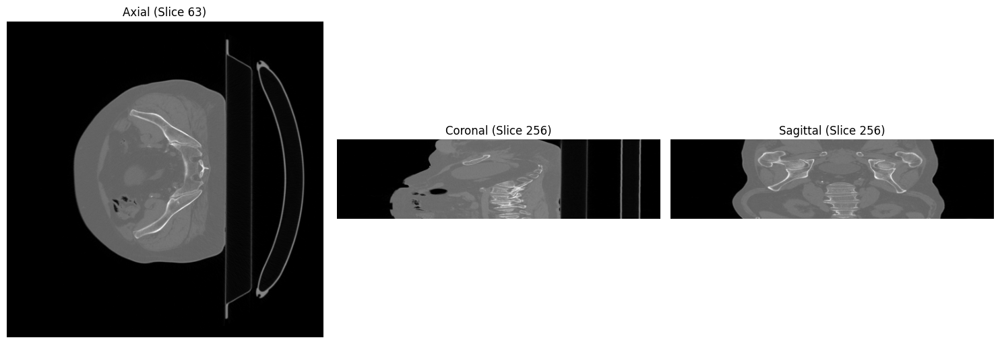

Data Range: -1526.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_24\Patient_24_fraction_1_.nii.gz


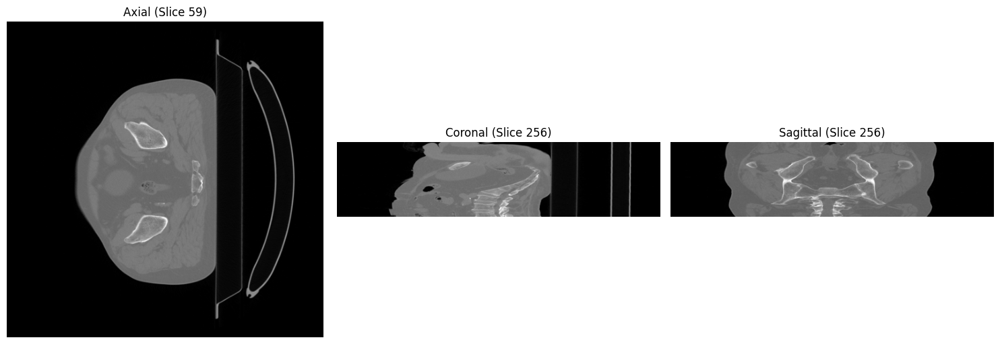

Data Range: -1305.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_25\Patient_25_fraction_1_.nii.gz


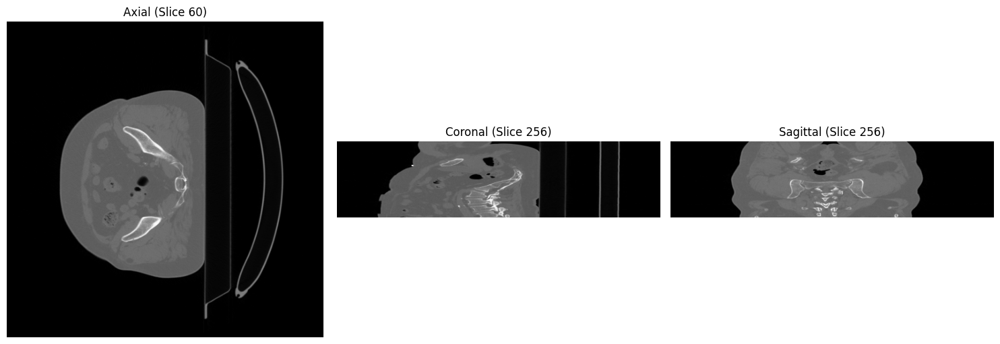

Data Range: -1502.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_27\Patient_27_fraction_1_.nii.gz


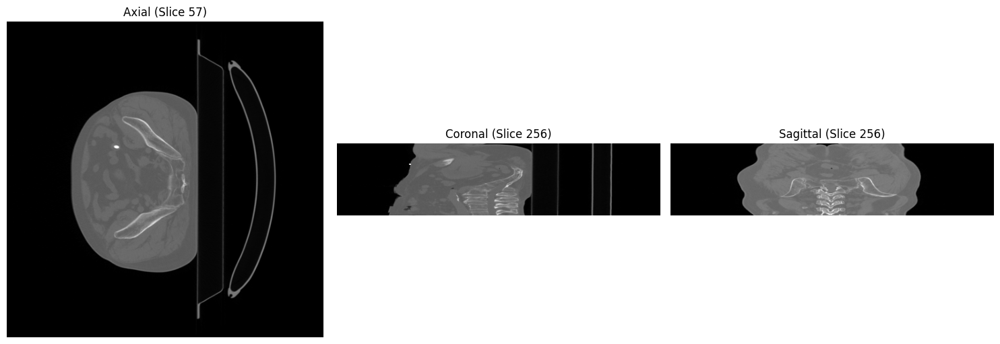

Data Range: -1360.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_28\Patient_28_fraction_1_.nii.gz


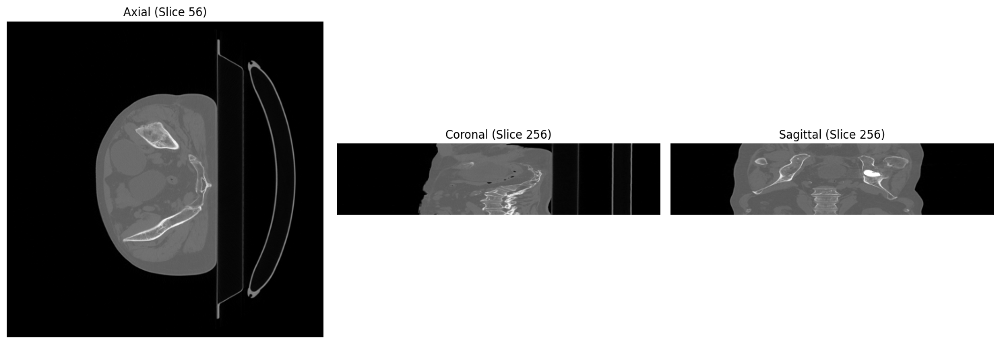

Data Range: -1333.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_29\Patient_29_fraction_1_.nii.gz


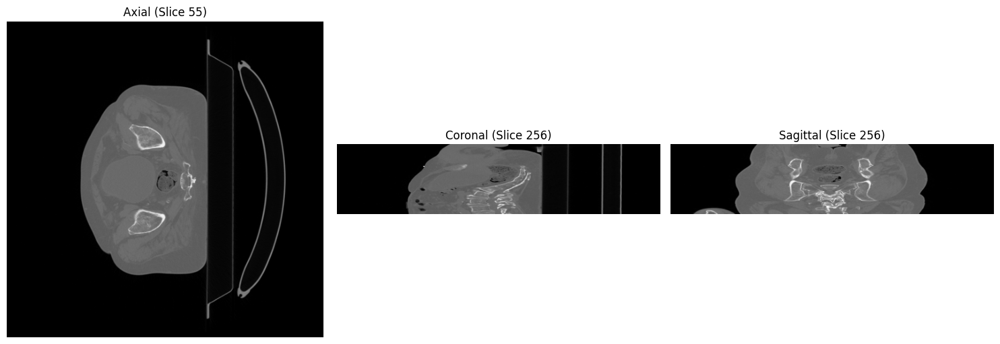

Data Range: -1534.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_30\Patient_30_fraction_1_.nii.gz


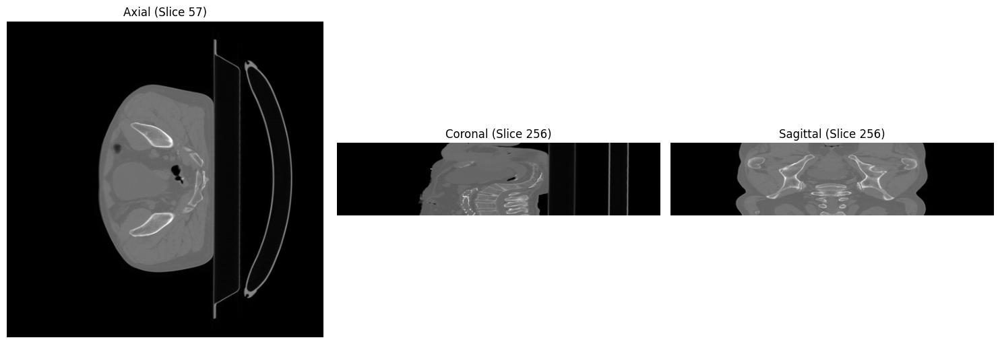

Data Range: -1397.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_31\Patient_31_fraction_1_.nii.gz


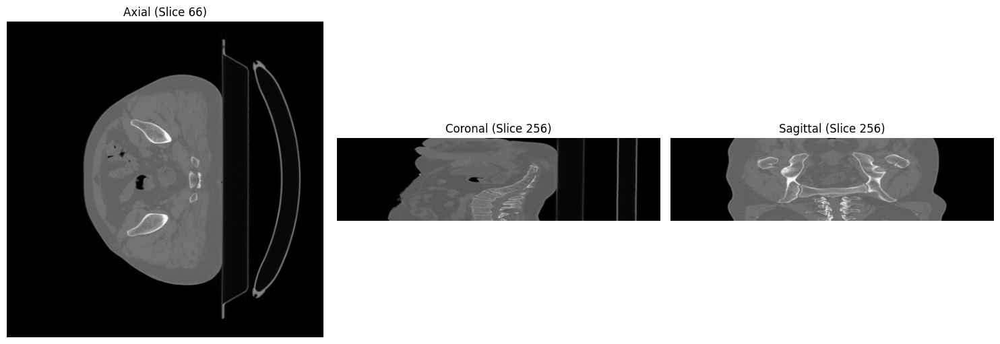

Data Range: -1314.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_32\Patient_32_fraction_1_.nii.gz


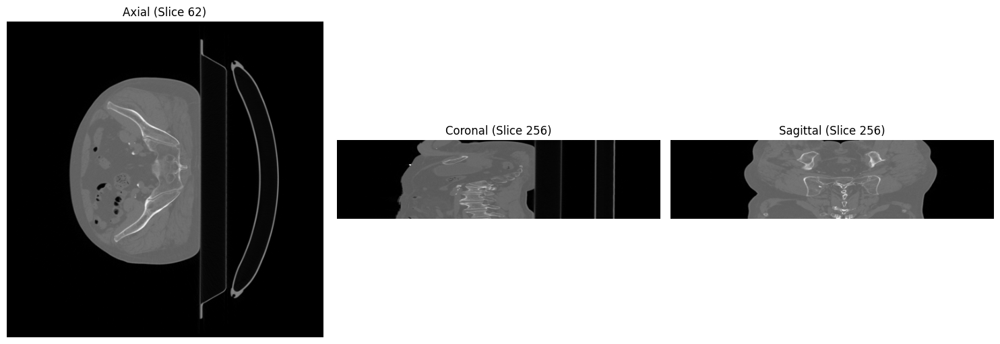

Data Range: -1379.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_33\Patient_33_fraction_1_.nii.gz


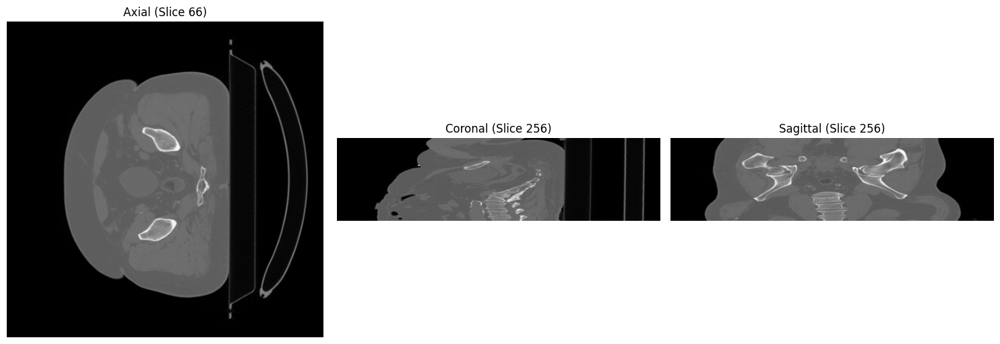

Data Range: -1316.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_34\Patient_34_fraction_1_.nii.gz


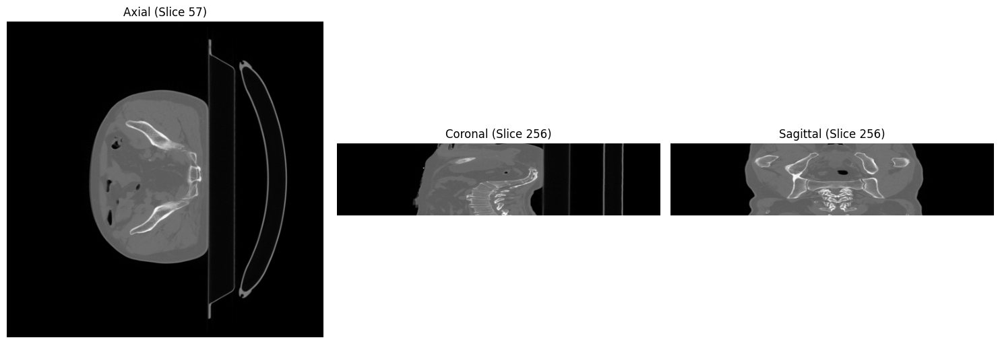

Data Range: -1321.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_35\Patient_35_fraction_1_.nii.gz


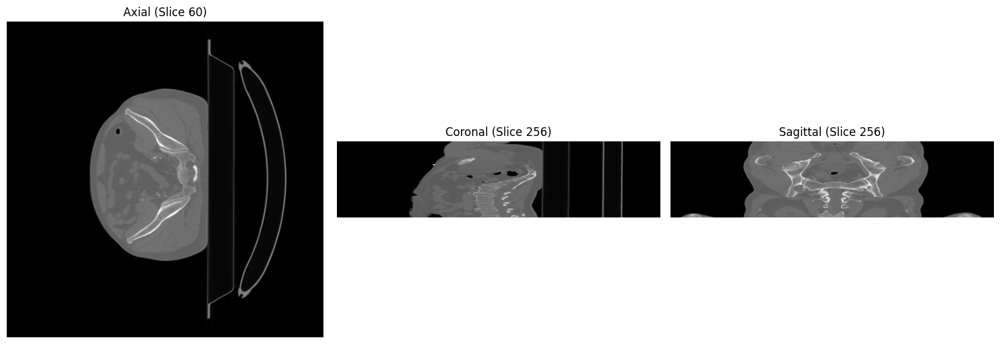

Data Range: -1320.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_36\Patient_36_fraction_1_.nii.gz


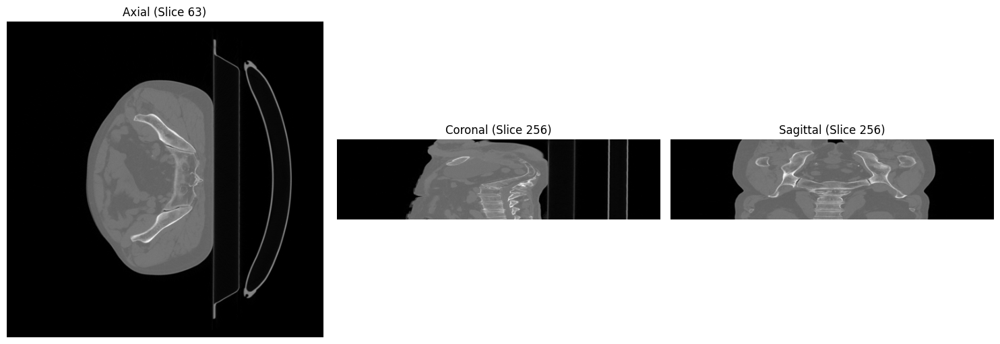

Data Range: -1342.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_37\Patient_37_fraction_1_.nii.gz


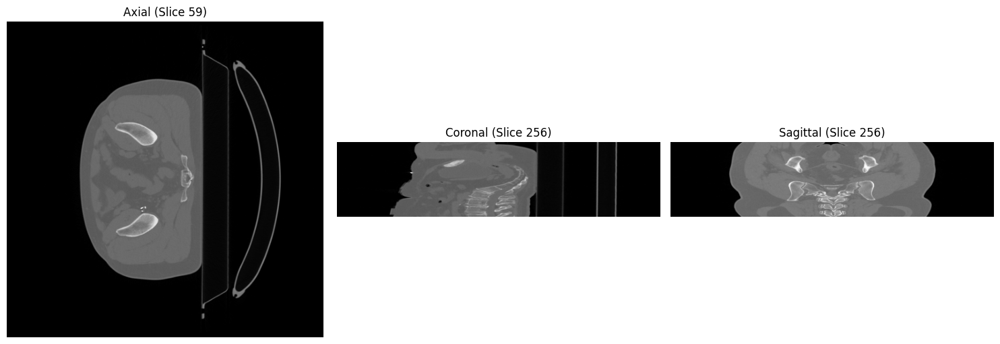

Data Range: -1345.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_39\Patient_39_fraction_1_.nii.gz


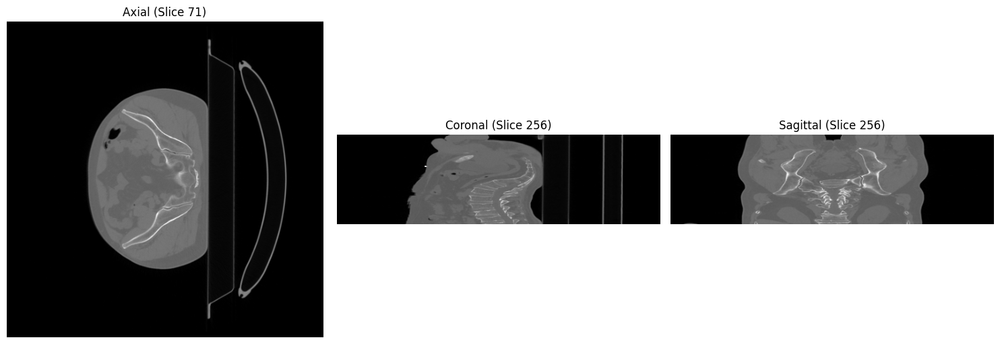

Data Range: -5053.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_42\Patient_42_fraction_1_.nii.gz


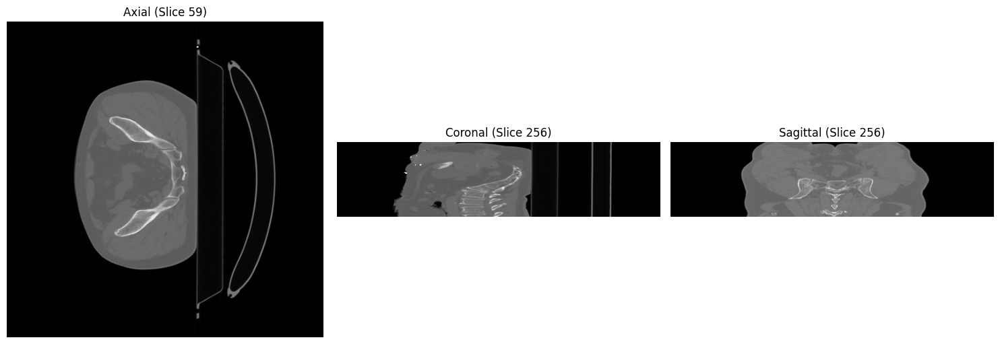

Data Range: -1324.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_43\Patient_43_fraction_1_.nii.gz


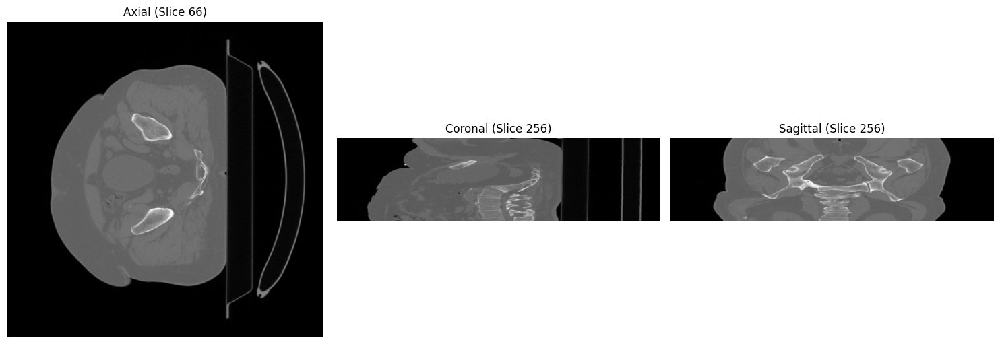

Data Range: -1306.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_44\Patient_44_fraction_1_.nii.gz


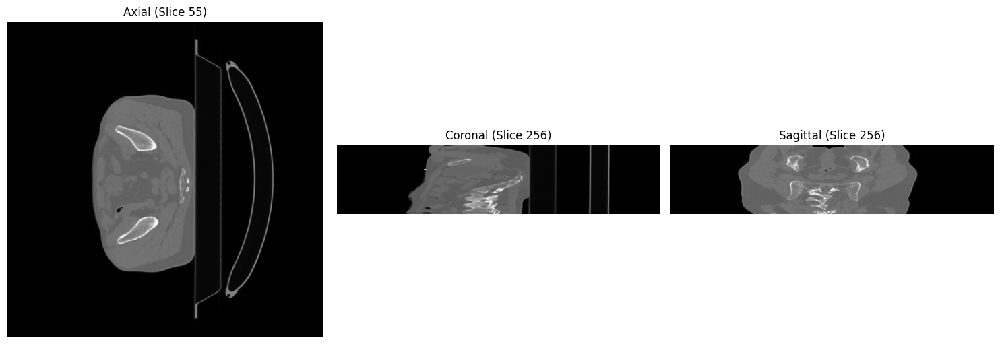

Data Range: -1333.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_45\Patient_45_fraction_1_.nii.gz


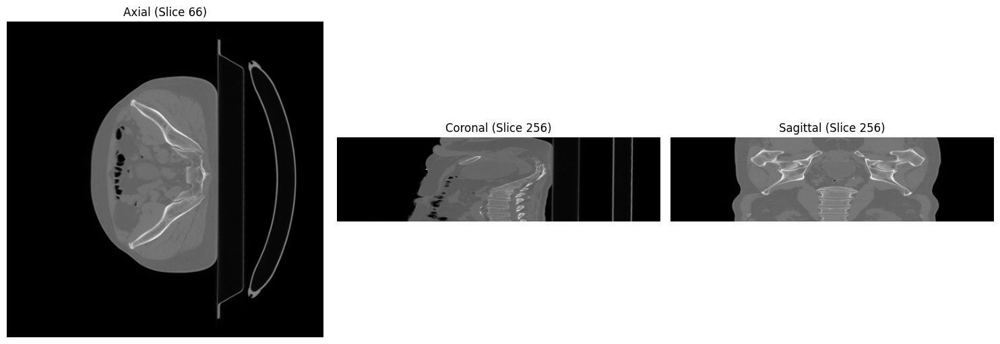

Data Range: -1442.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_47\Patient_47_fraction_1_.nii.gz


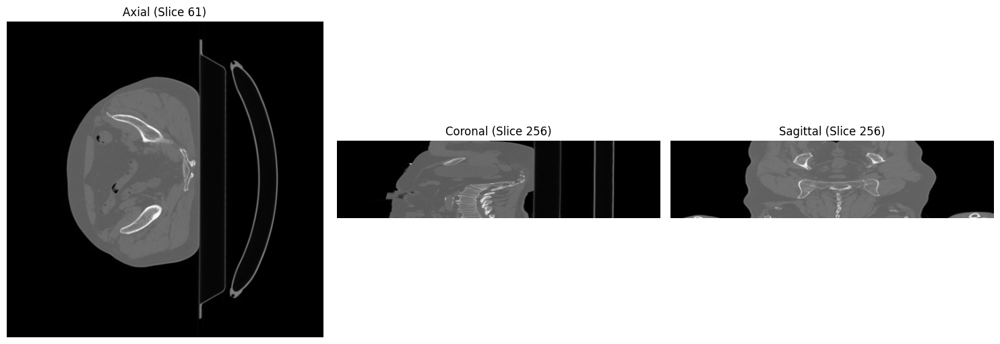

Data Range: -1321.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_48\Patient_48_fraction_1_.nii.gz


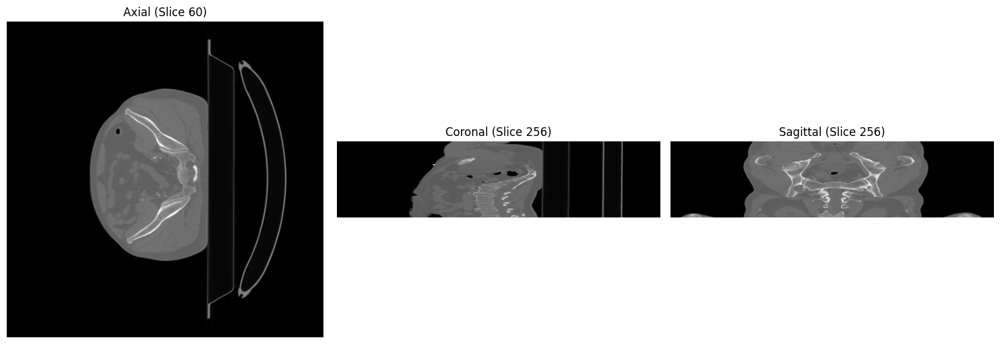

Data Range: -1307.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_49\Patient_49_fraction_1_.nii.gz


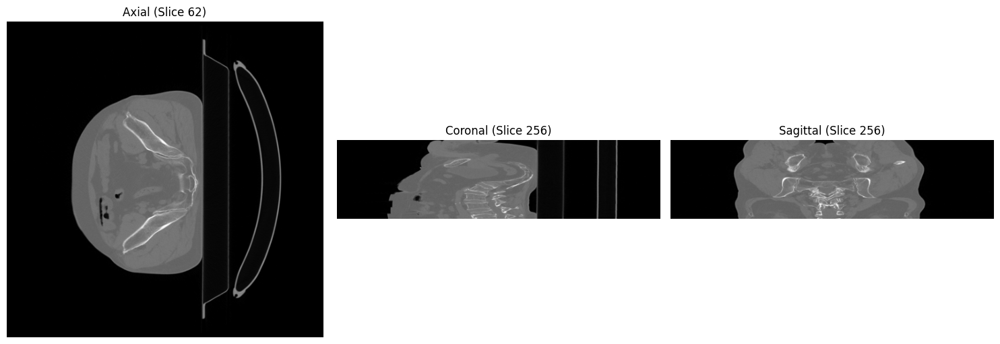

Data Range: -1315.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_50\Patient_50_fraction_1_.nii.gz


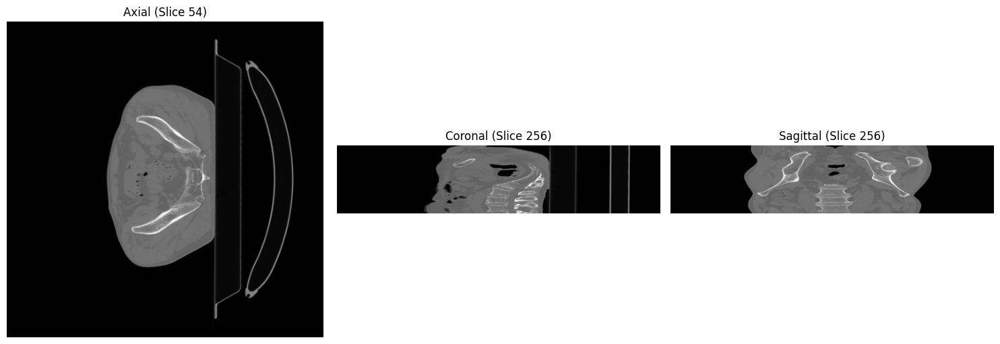

Data Range: -1315.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_53\Patient_53_fraction_1_.nii.gz


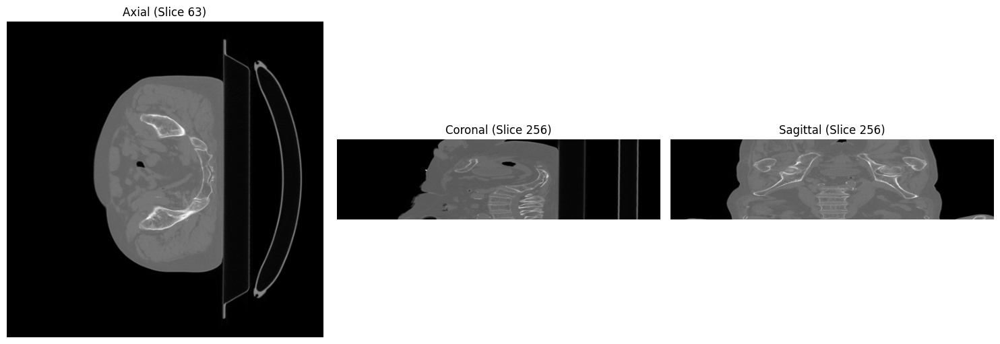

Data Range: -1382.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_54\Patient_54_fraction_1_.nii.gz


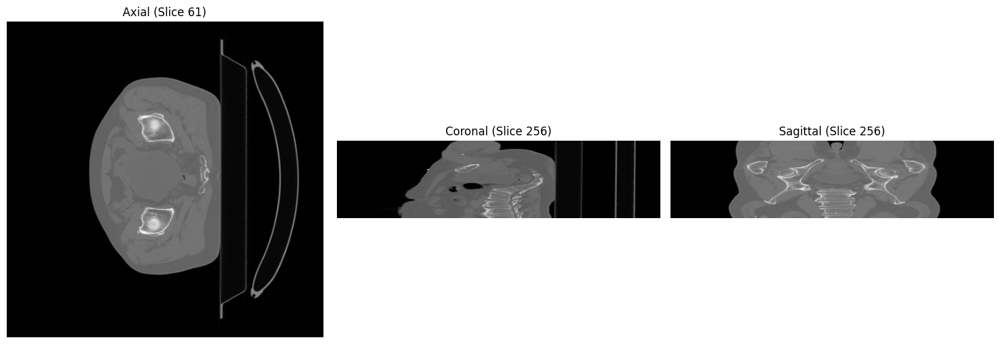

Data Range: -1350.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_55\Patient_55_fraction_1_.nii.gz


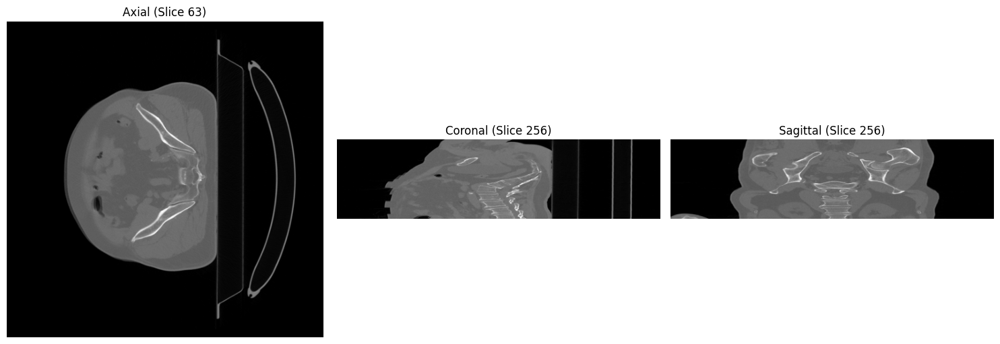

Data Range: -1317.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_56\Patient_56_fraction_1_.nii.gz


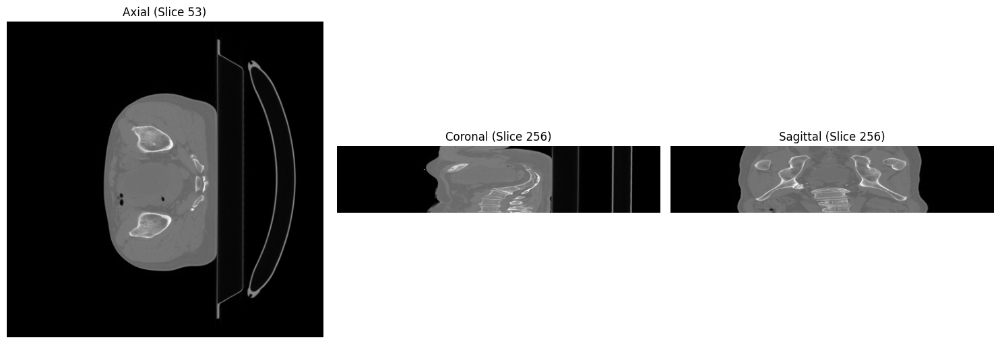

Data Range: -1349.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_57\Patient_57_fraction_1_.nii.gz


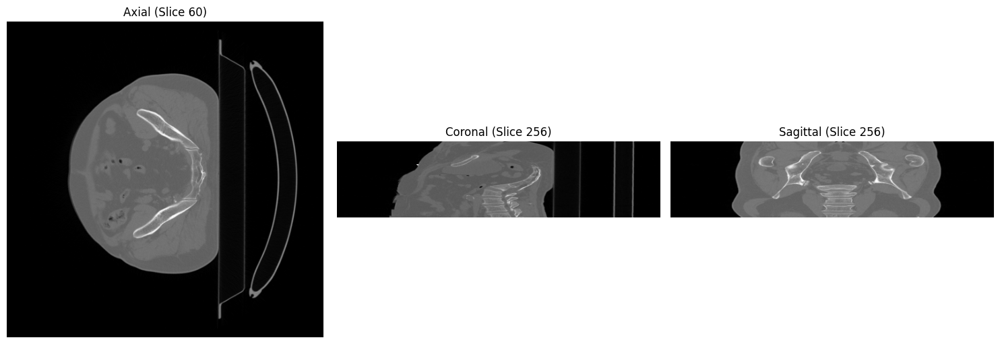

Data Range: -3666.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_60\Patient_60_fraction_1_.nii.gz


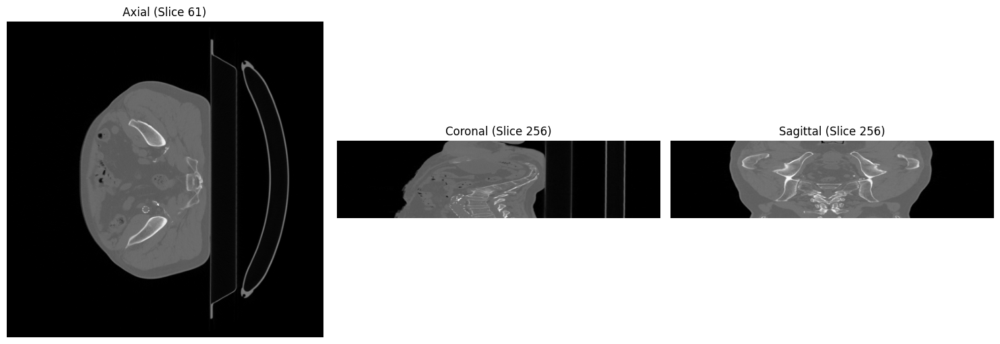

Data Range: -1385.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_62\Patient_62_fraction_1_.nii.gz


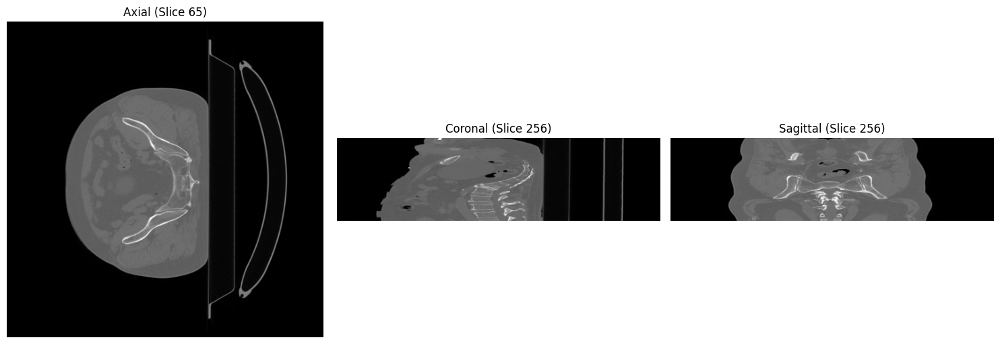

Data Range: -1024.00:798.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_63\Patient_63_fraction_12_.nii.gz


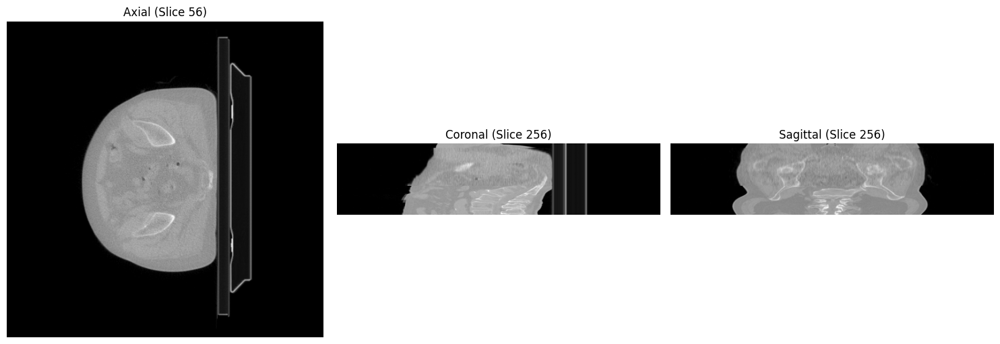

Data Range: -1024.00:798.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_63\Patient_63_fraction_13_.nii.gz


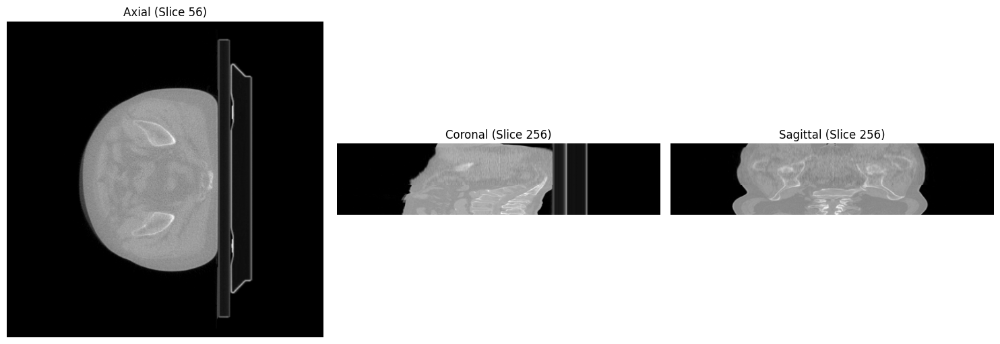

Data Range: -1024.00:798.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_63\Patient_63_fraction_14_.nii.gz


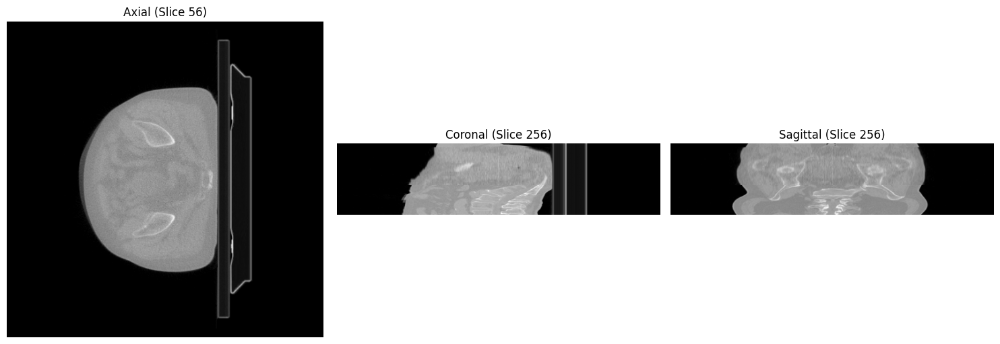

Data Range: -1024.00:798.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_63\Patient_63_fraction_15_.nii.gz


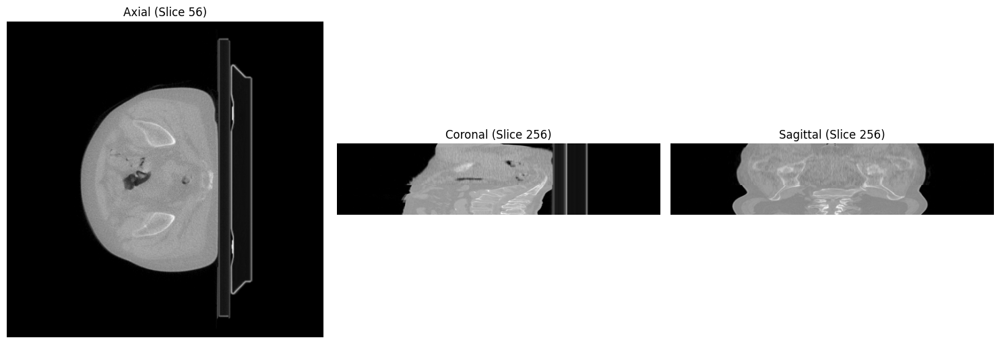

Data Range: -1024.00:798.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_63\Patient_63_fraction_21_.nii.gz


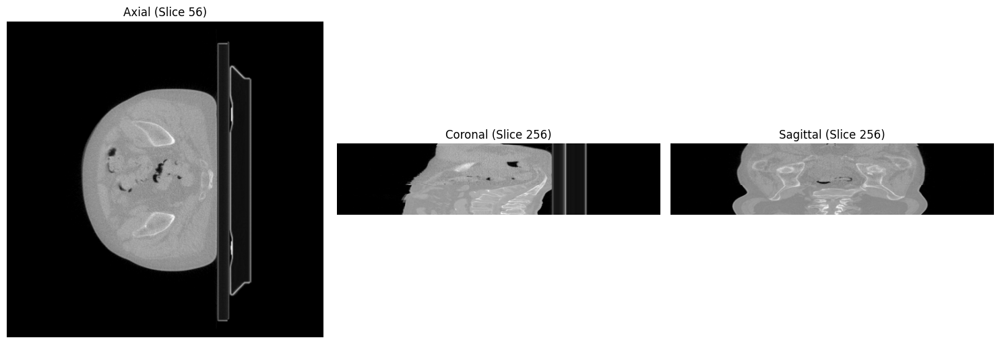

Data Range: -1024.00:798.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_63\Patient_63_fraction_22_.nii.gz


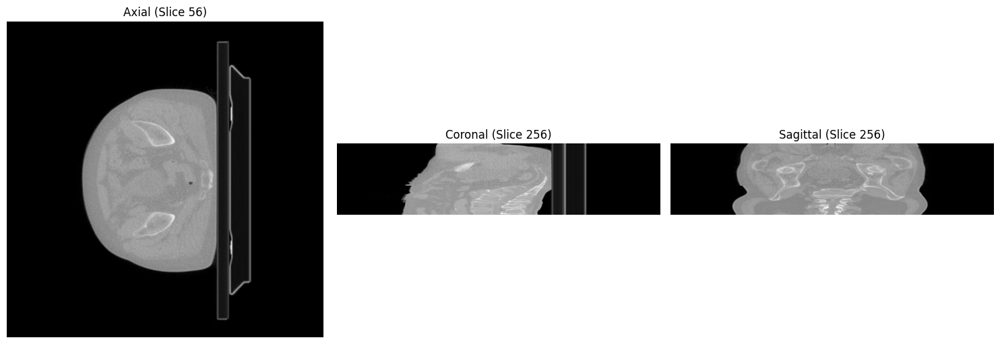

Data Range: -1024.00:798.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_63\Patient_63_fraction_23_.nii.gz


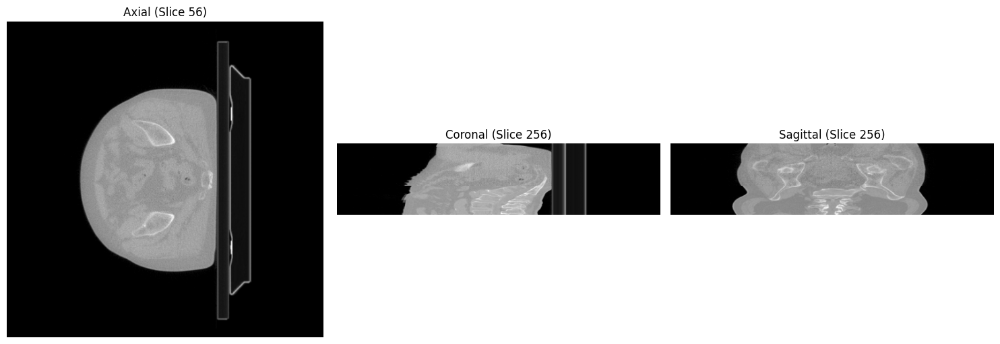

Data Range: -1312.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_63\Patient_63_fraction_2_.nii.gz


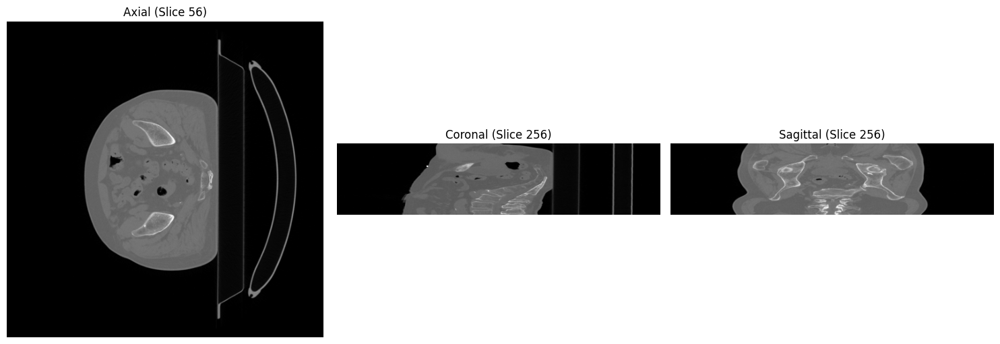

Data Range: -1642.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_64\Patient_64_fraction_1_.nii.gz


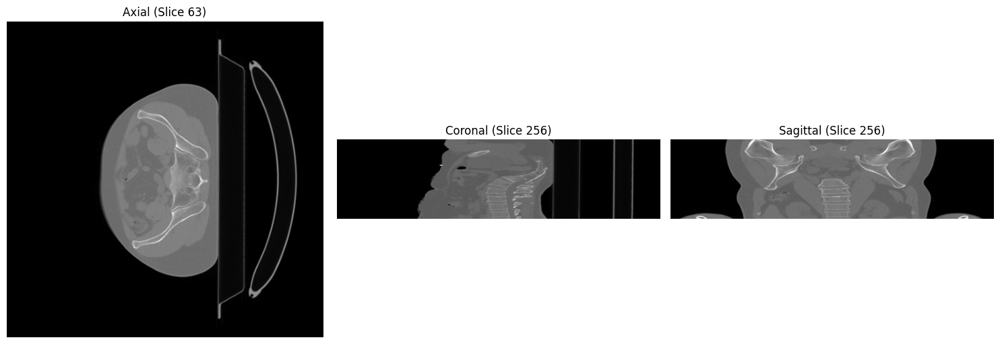

Data Range: -1024.00:759.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_64\Patient_64_fraction_21_.nii.gz


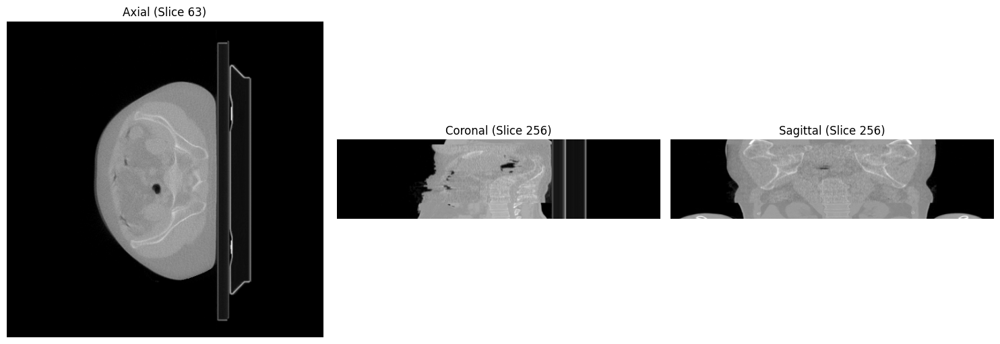

Data Range: -1024.00:759.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_64\Patient_64_fraction_22_.nii.gz


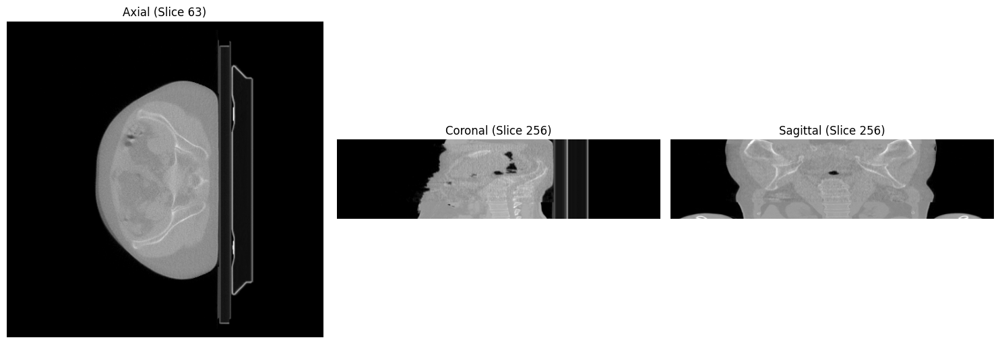

Data Range: -1024.00:759.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_64\Patient_64_fraction_23_.nii.gz


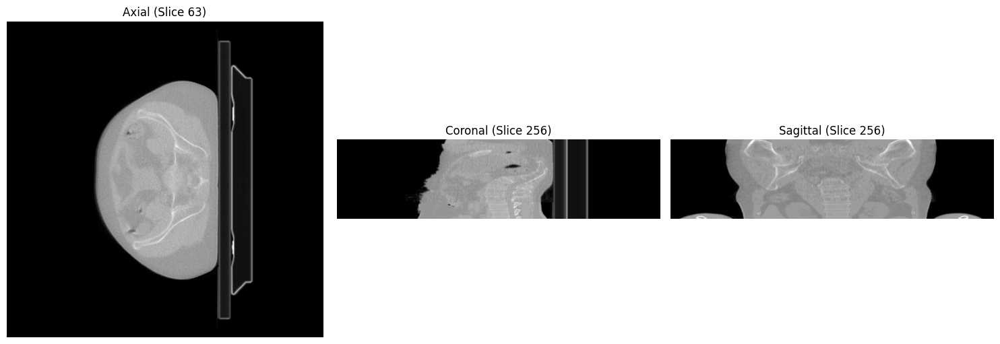

Data Range: -1024.00:759.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_64\Patient_64_fraction_3_.nii.gz


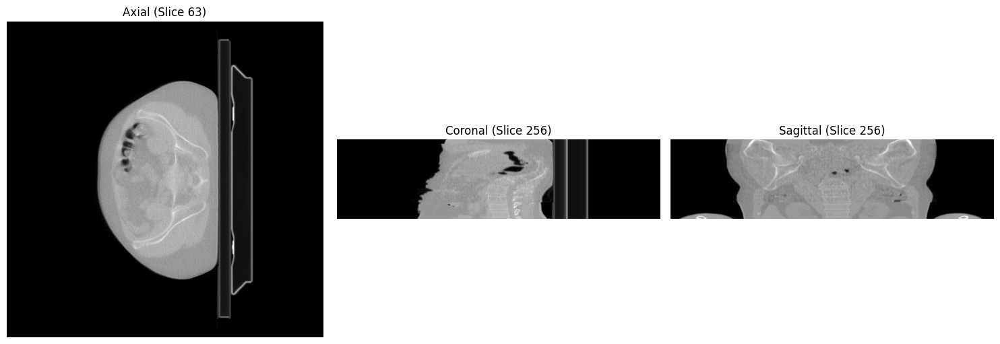

Data Range: -1024.00:759.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_64\Patient_64_fraction_4_.nii.gz


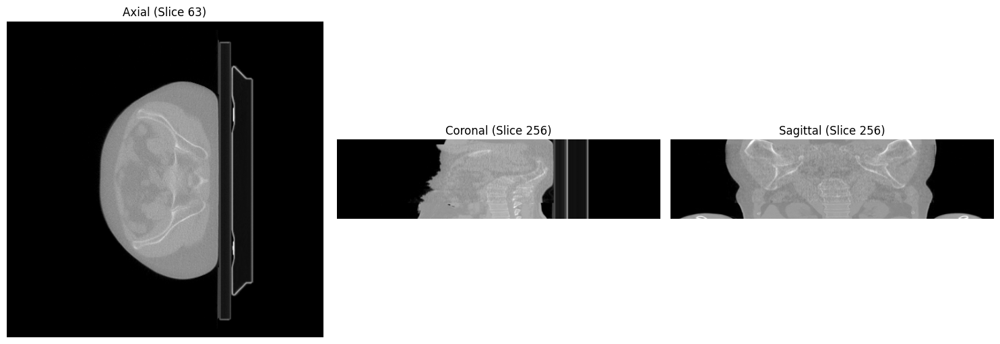

Data Range: -1303.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_65\Patient_65_fraction_1_.nii.gz


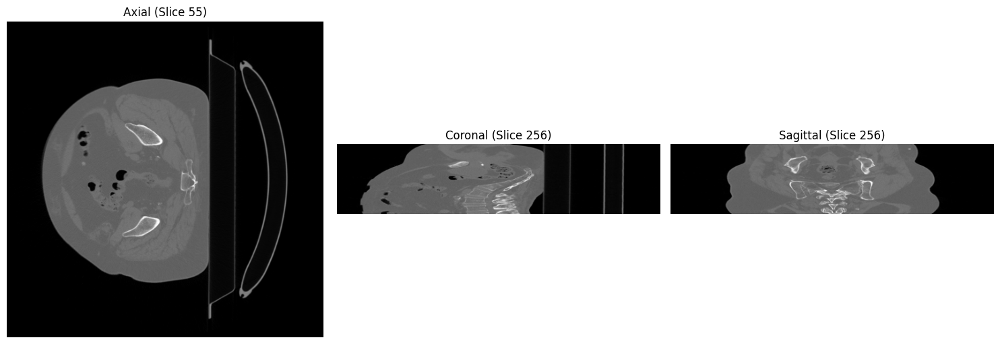

Data Range: -1407.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_66\Patient_66_fraction_1_.nii.gz


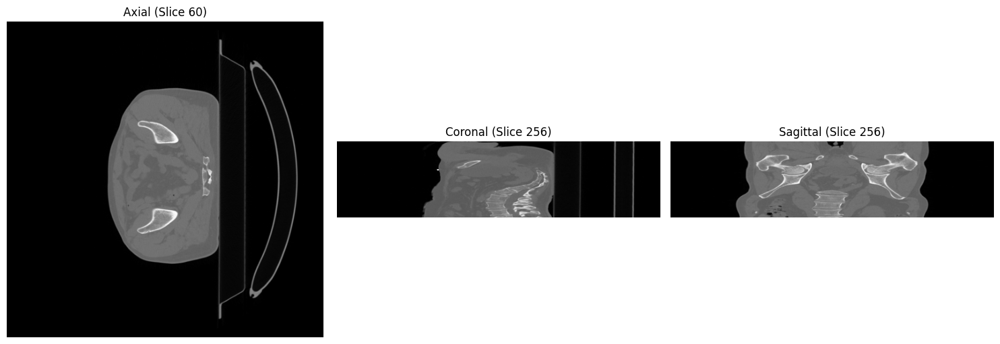

Data Range: -1024.00:867.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_66\Patient_66_fraction_24_.nii.gz


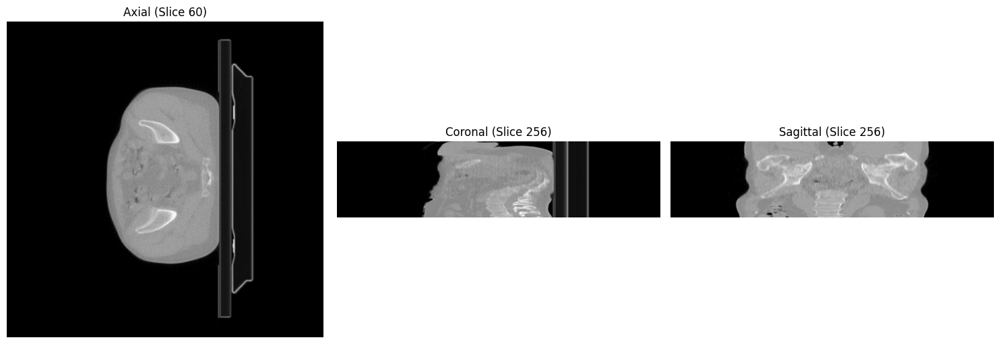

Data Range: -1024.00:867.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_66\Patient_66_fraction_32_.nii.gz


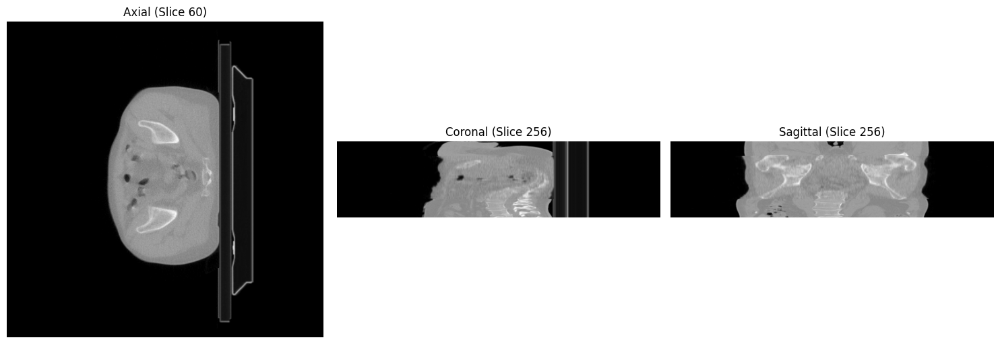

Data Range: -1024.00:867.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_66\Patient_66_fraction_33_.nii.gz


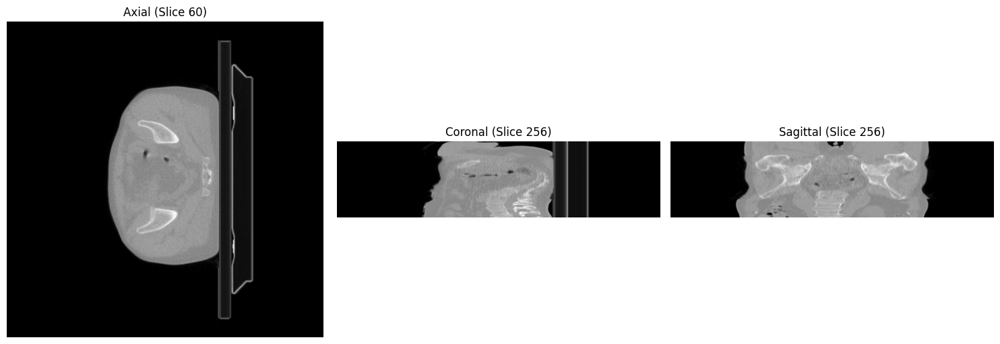

Data Range: -1313.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_67\Patient_67_fraction_1_.nii.gz


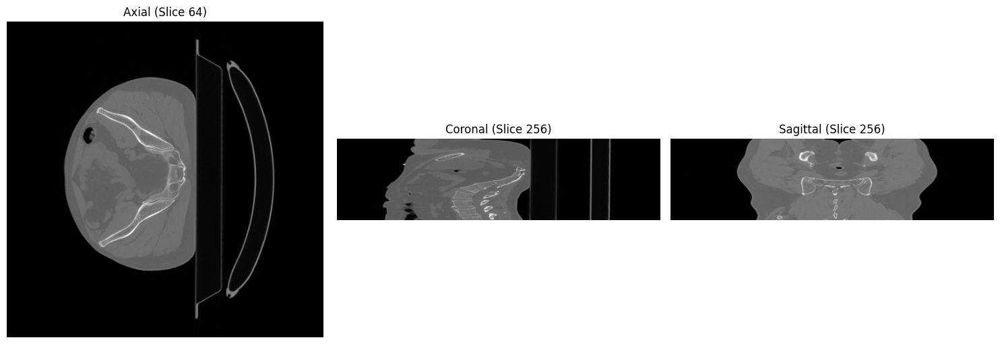

Data Range: -1365.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_68\Patient_68_fraction_1_.nii.gz


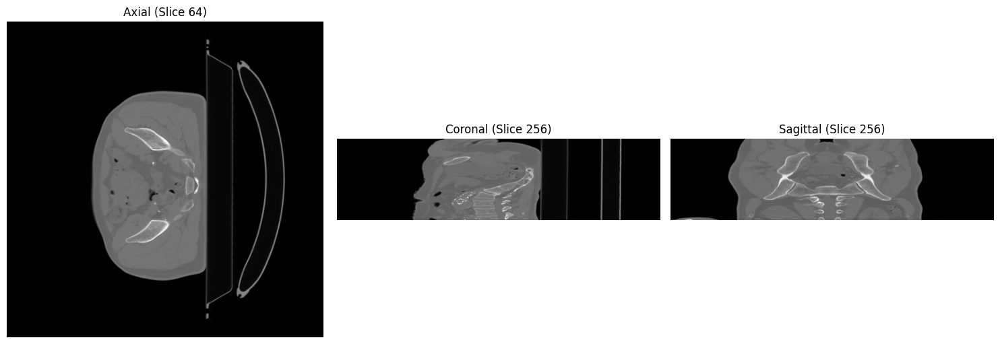

Data Range: -2200.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_69\Patient_69_fraction_1_.nii.gz


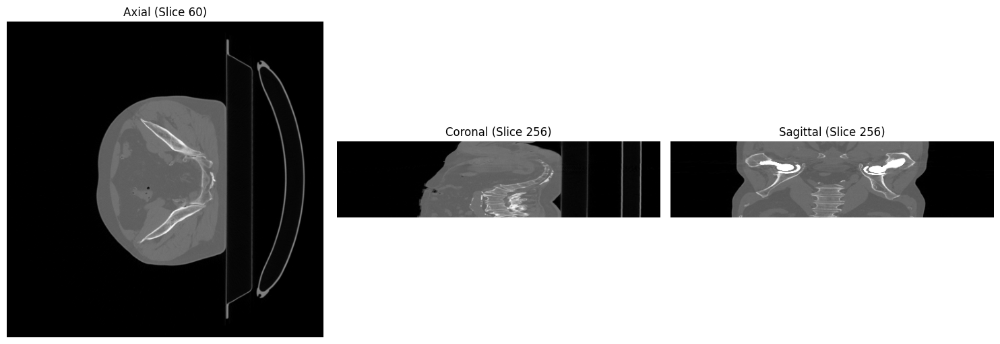

Data Range: -1390.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_70\Patient_70_fraction_1_.nii.gz


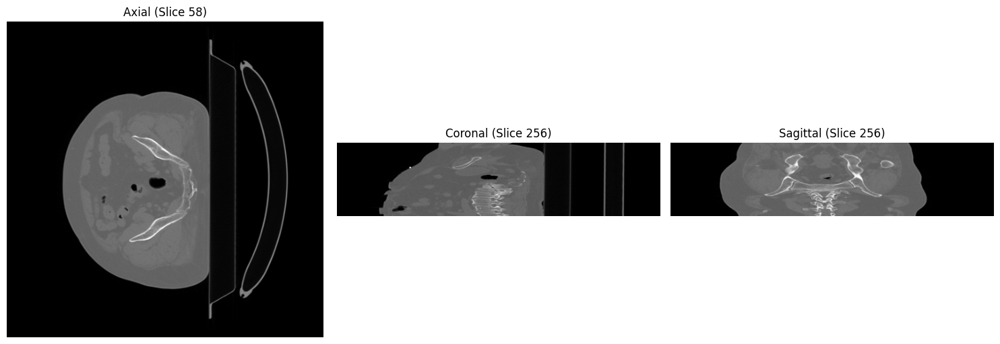

Data Range: -1295.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_71\Patient_71_fraction_1_.nii.gz


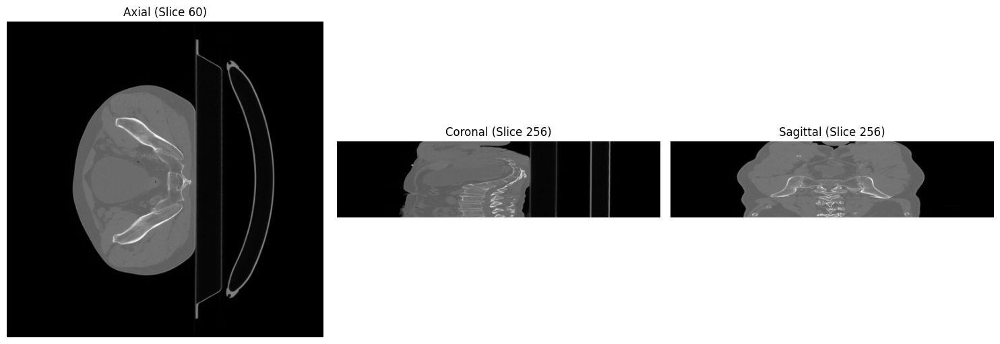

Data Range: -1367.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_74\Patient_74_fraction_1_.nii.gz


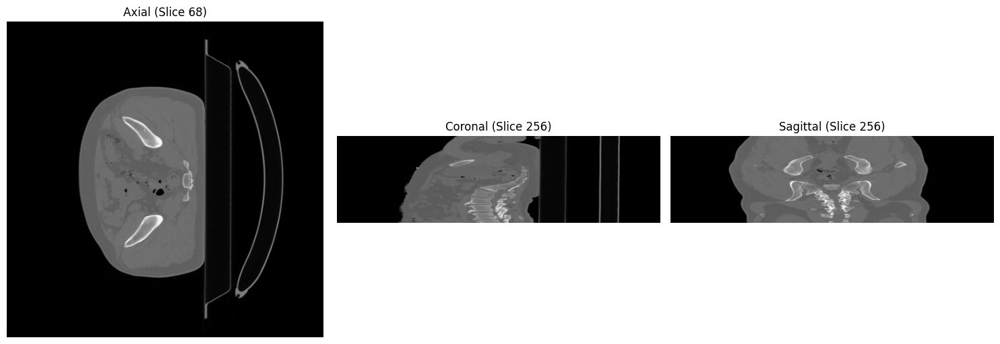

Data Range: -1309.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_76\Patient_76_fraction_1_.nii.gz


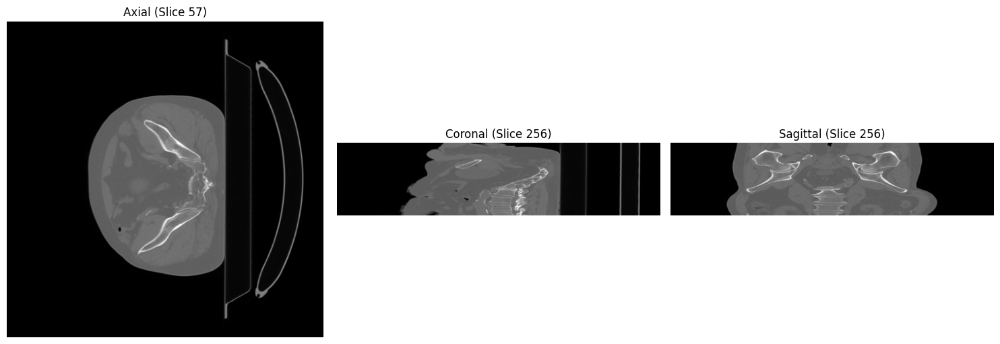

Data Range: -1024.00:860.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_76\Patient_76_fraction_7_.nii.gz


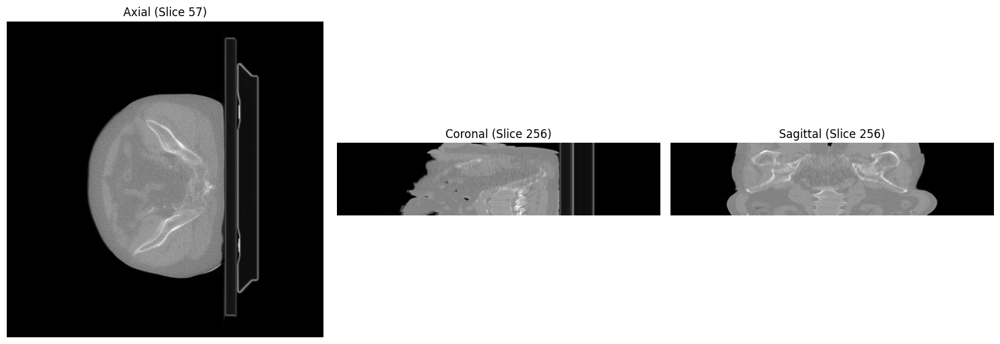

Data Range: -1352.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_77\Patient_77_fraction_1_.nii.gz


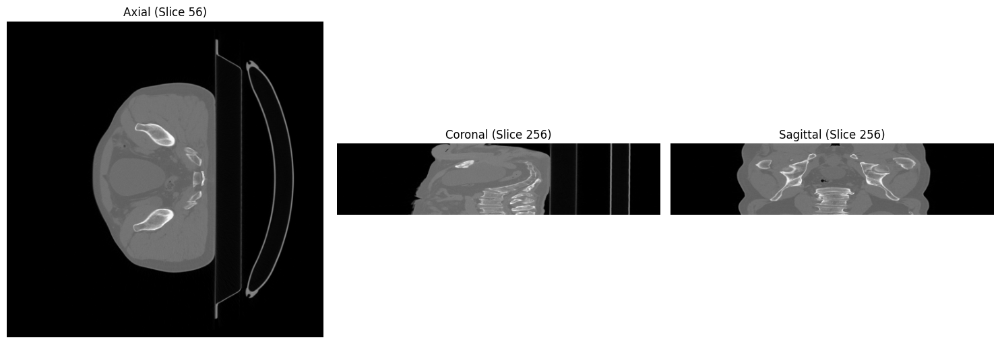

Data Range: -1024.00:821.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_77\Patient_77_fraction_7_.nii.gz


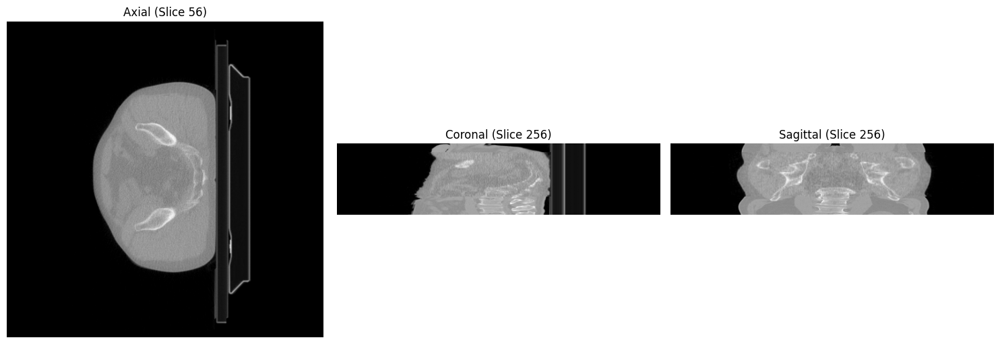

Data Range: -1332.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_78\Patient_78_fraction_1_.nii.gz


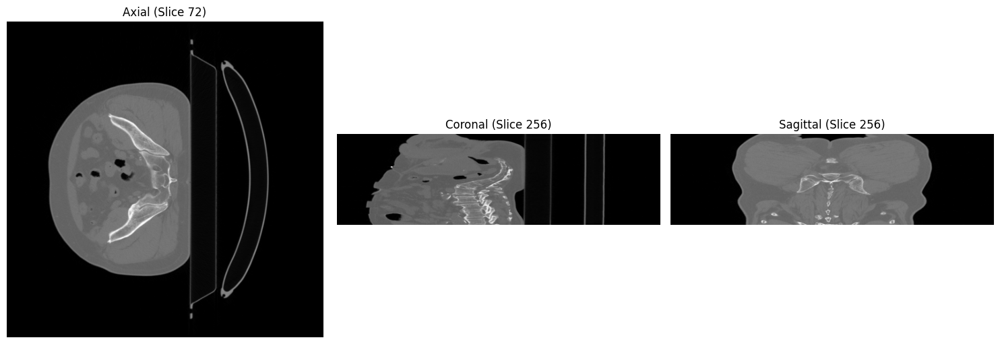

Data Range: -4160.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_79\Patient_79_fraction_1_.nii.gz


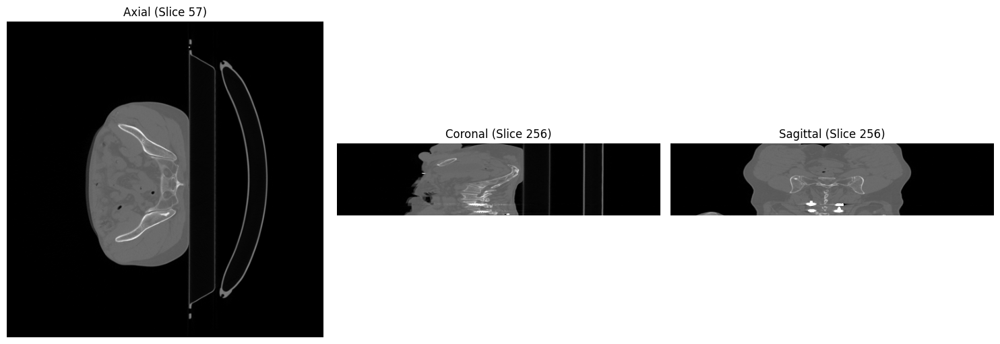

Data Range: -1377.00:1500.00, File: C:\Users\couch\Documents\robust-radiotherapy-planning\src\data_full\CT\Patient_80\Patient_80_fraction_1_.nii.gz


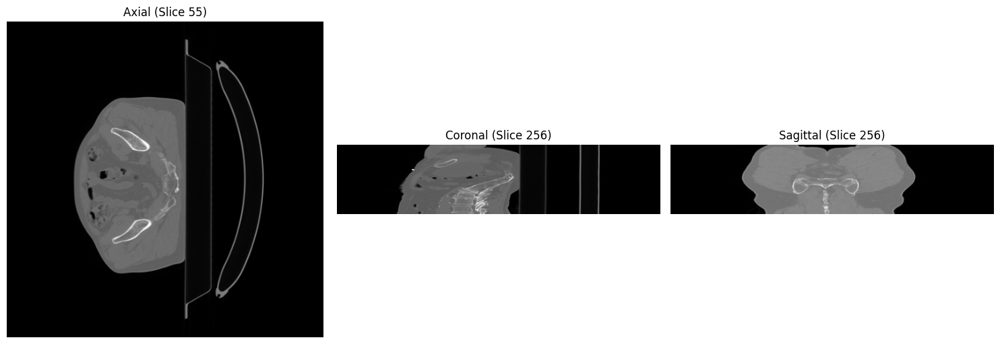

In [6]:
for file in sorted([*data_dict[0]["train"], *data_dict[0]["val"]]):
    img = nib.load(file)

    # Extract the image data as a NumPy array
    data = img.get_fdata()

    # Get the minimum and maximum value
    data_min = data.min()
    data_max = data.max()

    # Only display data if the minimum and maximum values are odd
    if data_min > -1025 and data_max > 1000:
        continue

    print(f"Data Range: {data_min:.2f}:{data_max:.2f}, File: {file}")

    # Normalize the data before visualization
    data = np.clip((data + 1000) / 2500, 0, 1)

    # Get middle indices for each axis
    idx_h, idx_w, idx_d = [s // 2 for s in data.shape]

    # Create the plot
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Axial view (Top-down)
    axes[0].imshow(data[:, :, idx_d].T, cmap="gray", origin="lower")
    axes[0].set_title(f"Axial (Slice {idx_d})")
    axes[0].axis("off")

    # Coronal view (Front-to-back)
    axes[1].imshow(data[:, idx_w, :].T, cmap="gray", origin="lower")
    axes[1].set_title(f"Coronal (Slice {idx_w})")
    axes[1].axis("off")

    # Sagittal view (Side-to-side)
    axes[2].imshow(data[idx_h, :, :].T, cmap="gray", origin="lower")
    axes[2].set_title(f"Sagittal (Slice {idx_h})")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

Scans with values lower than -1024 seem perfectly fine and they will be clipped and then used like everything else. Scans with an oddly low max HU value seem to be not proper CT scans (possibly CBCT scans) or simply the machine taking the scan was malfunctioning, either way they will be blacklisted from training and validation data.